## Image classification using CNNs in Keras
### Data Description:
You are provided with a training set and a test set of images of plant seedlings at various stages of grown. Each image has a filename that is its unique id. The dataset comprises 12 plant species. The goal of the competition is to create a classifier capable of determining a plant's species from a photo.

### Dataset:
The project is from a dataset from Kaggle.
Link to the Kaggle project site: https://www.kaggle.com/c/plant-seedlings-classification/data
The dataset has to be downloaded from the above Kaggle website.

### Context:
Can you differentiate a weed from a crop seedling?
The ability to do so effectively can mean better crop yields and better stewardship of the environment.
The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has recently released a dataset containing images of approximately 960 unique plants belonging to 12 species at several growth stages.

### Objective:
To implement the techniques learnt as a part of the course.
Learning Outcomes:
 Pre-processing of image data.
 Visualization of images.
 Building CNN
 Evaluate the Model

### Steps and tasks:
1. Import the libraries, load dataset, print shape of data, visualize the images in dataset. (5 Marks)
2. Data Pre-processing: (15 Marks)
    a. Normalization.
    b. Gaussian Blurring.
    c. Visualize data after pre-processing.
3. Make data compatible: (10 Marks)
    a. Reshape data into shapes compatible with Keras models.
    b. Convert labels from digits to one hot vectors.
    c. Print the label for y_train[0].
4. Building CNN: (15 Marks)
    a. Define layers.
    b. Set optimizer and loss function. (Use Adam optimizer and categorical crossentropy)
5. Fit and evaluate model. (10 Marks)
6. Visualize predictions for x_test[2], x_test[3], x_test[33], x_test[36], x_test[59]. (5 Marks)


### Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import cv2
import seaborn as sns
from sklearn import svm
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

from skimage import data, io
import matplotlib.pyplot as plt

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
import warnings
# Suppress warnings
warnings.filterwarnings('ignore')

from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense, Dropout

from scipy.signal import convolve2d
kernel = np.array([[0.003765,0.015019,0.023792,0.015019,0.003765],
                   [0.015019,0.059912,0.094907,0.059912,0.015019],
                   [0.023792,0.094907,0.150342,0.094907,0.023792],
                   [0.015019,0.059912,0.094907,0.059912,0.015019],
                   [0.003765,0.015019,0.023792,0.015019,0.003765]])

from keras.preprocessing.image import ImageDataGenerator

import os
import cv2
from google.colab.patches import cv2_imshow
from zipfile import ZipFile

## Reusable libraries
def extract_images(directory):
  with ZipFile(directory, 'r') as zip:
    zip.extractall()

def perform_test_image_analysis(directory):
    for filename in os.listdir(directory):
      image = cv2.imread(directory+filename)
      print('The shape of image is: ', image.shape)
      cv2_imshow(image)

def perform_train_image_analysis(directory):
  for filename1 in os.listdir(directory):
    subdir = directory+filename1;
    print('Analyzing images in : ', filename1)
    for filename in os.listdir(subdir):
      image = cv2.imread(subdir+'/'+filename)
      print('The shape of image is: ', image.shape)
      cv2_imshow(image)

def apply_gaussian_blurr(directory):
  for filename1 in os.listdir(directory):
    subdir = directory+filename1;
    print('Appltisng Gaussian Blurr in : ', filename1)
    for filename in os.listdir(subdir):
      image = cv2.imread(subdir+'/'+filename)
      image = cv2.GaussianBlur(image, (5, 5),cv2.BORDER_DEFAULT)
      print('The shape of image is: ', image.shape)
      cv2_imshow(image)

def prepare_xtrain_ytrain(train_set,batch_size,X_train,y_train):
  for i in range(round(len(train_set.filenames)/batch_size)):
    X_train_batch,y_train_batch = train_set.next()
    X_train.append(X_train_batch)
    y_train.append(y_train_batch)
  X_train = np.concatenate(X_train)
  y_train = np.concatenate(y_train)

def prepare_xval_yval(validation_set,batch_size,X_validation,y_validation):
  for i in range(round(len(validation_set.filenames)/batch_size)):
    X_validation_batch,y_validation_batch = validation_set.next()
    X_validation.append(X_validation_batch)
    y_validation.append(y_validation_batch)
  X_validation = np.concatenate(X_validation)
  y_validation = np.concatenate(y_validation)

import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import img_to_array
from keras.callbacks import TensorBoard
%load_ext tensorboard

def get_name(file_path):
  parts = tf.strings.split(file_path,os.path.sep)
  return parts[-1]

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


### Mount the drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


### Extracting and loading the data

In [0]:
rm /content/drive/My Drive/Colab Notebooks/ImageClassificationData/train
rm /content/drive/My Drive/Colab Notebooks/ImageClassificationData/test
mkdir '/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train'
mkdir '/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test'

In [0]:
cd '/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train'
extract_images("/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train.zip")
!ls

/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train


In [0]:
cd '/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test'
extract_images("/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test.zip")
!ls

/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test


### Iterating the directory, checking the size, and showing the images

The shape of image is:  (196, 196, 3)


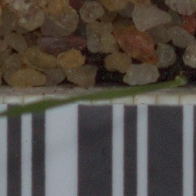

The shape of image is:  (388, 388, 3)


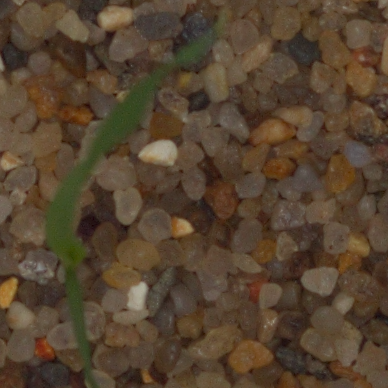

The shape of image is:  (886, 886, 3)


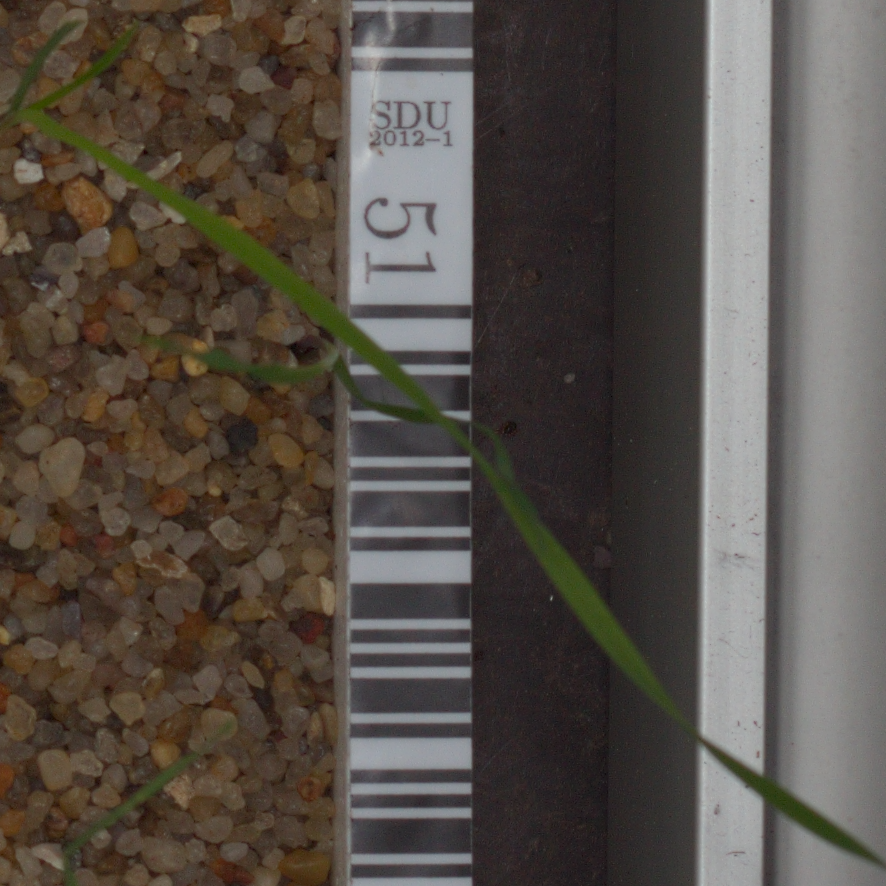

The shape of image is:  (117, 117, 3)


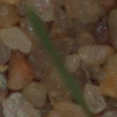

The shape of image is:  (471, 471, 3)


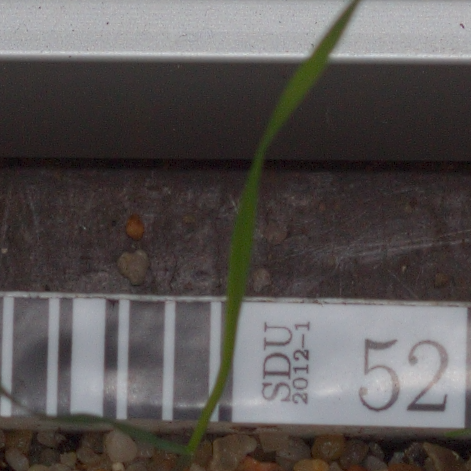

The shape of image is:  (1074, 1074, 3)


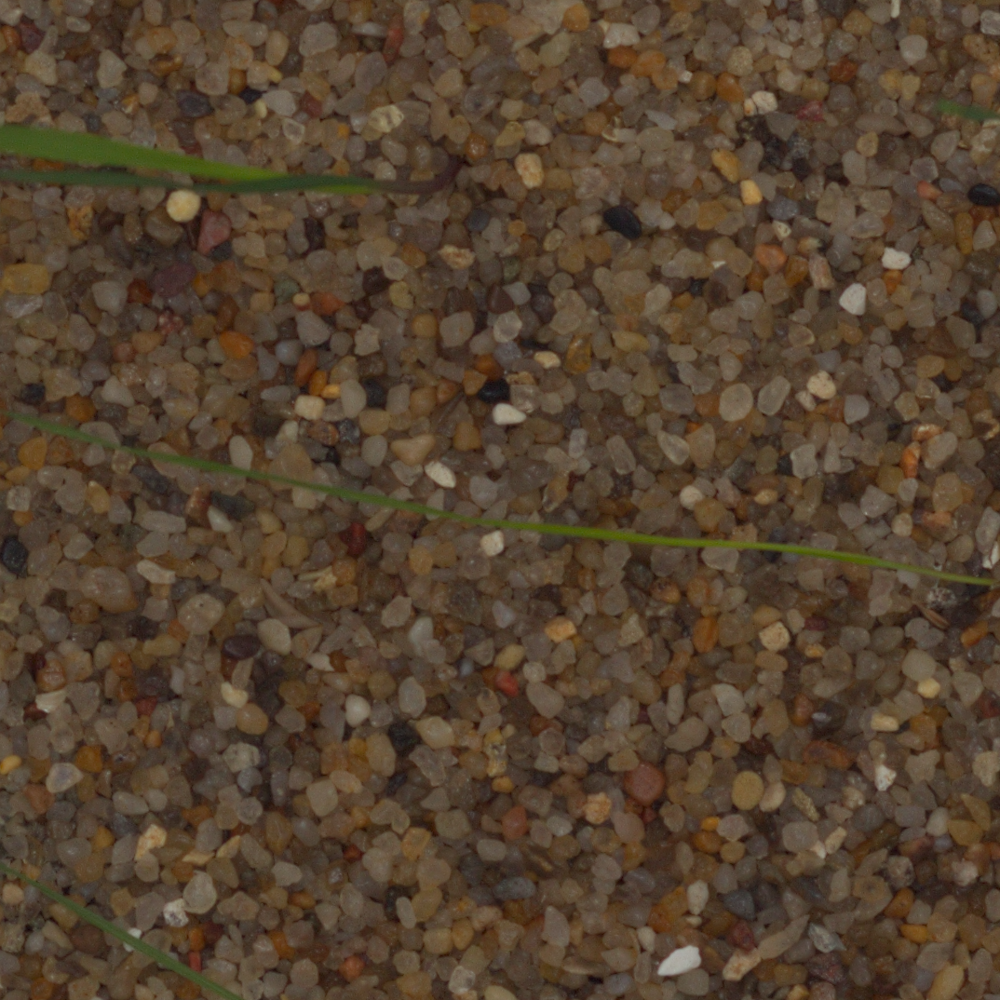

The shape of image is:  (251, 251, 3)


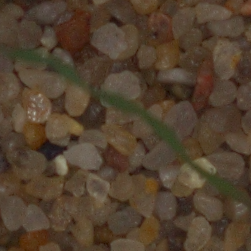

The shape of image is:  (1899, 1900, 3)


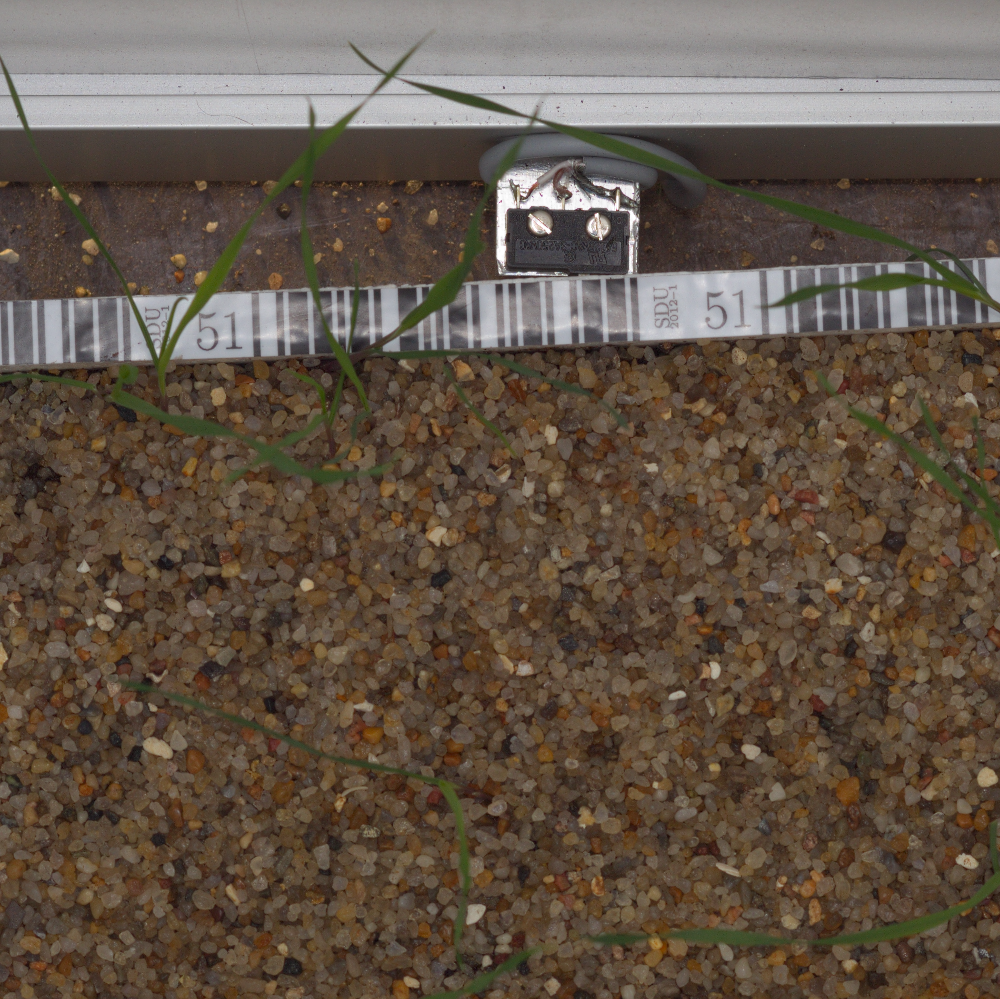

The shape of image is:  (531, 531, 3)


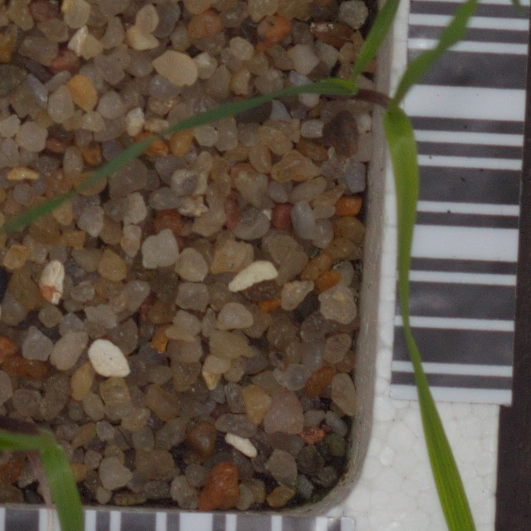

The shape of image is:  (352, 352, 3)


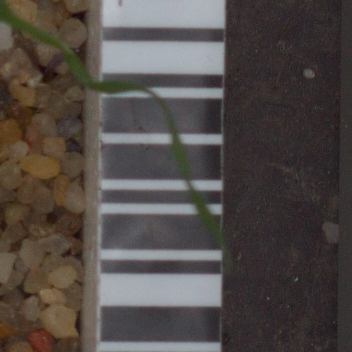

The shape of image is:  (1782, 1836, 3)


KeyboardInterrupt: ignored

In [0]:
directory='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train/'
perform_train_image_analysis(directory)

directory='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/'
perform_test_image_analysis(directory)

### Preprocessing the data

In [0]:
directory='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train/'
apply_gaussian_blurr(directory)

### Generating the train, validation and test data

In [24]:
# Create data generator for training data with data augmentation , one hot encode and normalizing all
# values by 255
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   validation_split=0.3,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

# Setting training data generator's source directory
# Setting the target size to resize all the images to (64,64) as the model input layer expects 64X64 images

training_set = train_datagen.flow_from_directory('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train/',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 subset='training',
                                                 class_mode = 'categorical')
validation_set = train_datagen.flow_from_directory('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train/',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 subset='validation',
                                                 class_mode = 'categorical')

# Setting testing data generator's source directory
test_set = test_datagen.flow_from_directory('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 3330 images belonging to 12 classes.
Found 1420 images belonging to 12 classes.
Found 0 images belonging to 0 classes.


### Creating classifier and model

In [0]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), input_shape = (64, 64, 3), activation = 'relu', padding = 'same'))

# Add a Max Pooling layer of size 2X2
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'valid'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 512 neurons
classifier.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.5))

# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))


# The final output layer with 10 neurons to predict the categorical classifcation
classifier.add(Dense(units = 12, activation = 'softmax'))

### Optimizer and Loss function

In [0]:
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

### Fitting the model

In [0]:
# There are 1098 training images and 272 test images in total
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")
train_history = classifier.fit_generator(training_set,
                         steps_per_epoch = int(training_set.n/32),
                         #epochs = 10,
                         epochs = 30,
                         validation_data = validation_set,
                         validation_steps = int(validation_set.n/32))
                         #,callbacks=[tensorboard_callback])
print('Avg loss:',np.average(train_history.history['loss']))
print('Avg accuracy:',np.average(train_history.history['accuracy']))
print('Avg validation loss:',np.average(train_history.history['val_loss']))
print('Avg validation accuracy:',np.average(train_history.history['val_accuracy']))

Epoch 1/30
104/104 [==============================] - 78s 754ms/step - loss: 2.3277 - accuracy: 0.1868 - val_loss: 1.7234 - val_accuracy: 0.3459
Epoch 2/30
104/104 [==============================] - 80s 772ms/step - loss: 1.7272 - accuracy: 0.3854 - val_loss: 1.7924 - val_accuracy: 0.4424
Epoch 3/30
104/104 [==============================] - 80s 766ms/step - loss: 1.4915 - accuracy: 0.4642 - val_loss: 1.1472 - val_accuracy: 0.5238
Epoch 4/30
104/104 [==============================] - 81s 775ms/step - loss: 1.2844 - accuracy: 0.5373 - val_loss: 1.0698 - val_accuracy: 0.6210
Epoch 5/30
104/104 [==============================] - 80s 770ms/step - loss: 1.1197 - accuracy: 0.6119 - val_loss: 0.8851 - val_accuracy: 0.6599
Epoch 6/30
104/104 [==============================] - 79s 759ms/step - loss: 1.0316 - accuracy: 0.6431 - val_loss: 0.4458 - val_accuracy: 0.6823
Epoch 7/30
104/104 [==============================] - 80s 771ms/step - loss: 0.9335 - accuracy: 0.6737 - val_loss: 0.9177 - val_ac

### Saving the classifier

In [10]:
cd /content/drive/My Drive/Colab Notebooks/ImageClassificationData

/content/drive/My Drive/Colab Notebooks/ImageClassificationData


In [11]:
classifier.save('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/classifier.h5')
classifier.save_weights('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/classifier_weights.h5')
!ls

classifier.h5					       test	 train_1
classifier_weights.h5				       test_1	 train.zip
datasets_118250_283795_cifar10_test_airplane_0001.png  test.zip
sample_submission.csv				       train


### Testing the model

In [0]:
from keras.models import load_model
import numpy as np
from keras.preprocessing import image

# Load the pre trained model from the HDF5 file saved previously
pretrained_model = load_model('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/classifier.h5')
pretrained_model.load_weights('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/classifier_weights.h5')

In [13]:
import cv2
im2='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/00d090cde.png'
im3='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/00ef713a8.png'
im33='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/1dc7c45df.png'
im36='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/1f5e5554e.png'
im59='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/3abb502fb.png'
test_image = cv2.imread(im59)
#test_image = cv2.imread('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/datasets_118250_283795_cifar10_test_airplane_0001.png')

# Check if the size of the Image array is compatible with Keras model
print('Actual shape: ' + str(test_image.shape))

##Reshape-start
test_image = cv2.resize(test_image, (64, 64), interpolation = cv2.INTER_AREA)
print('After reshape: ' + str(test_image.shape))
##Reshape-end

# If not compatible expand the dimensions to match with the Keras Input
test_image = np.expand_dims(test_image, axis = 0)
test_image =test_image*1/255.0

#Check the size of the Image array again
print('After expand_dims: '+ str(test_image.shape))


#Predict the result of the test image
result = classifier.predict(test_image)

# Check the indices Image Data Generator has allotted to each folder
classes_dict = training_set.class_indices
print(classes_dict)

# Creating a list of classes in test set for showing the result as the folder name
prediction_class = []
for class_name,index in classes_dict.items():
  prediction_class.append(class_name)
  
print(result[0])

# Index of the class with maximum probability
predicted_index = np.argmax(result[0])

# Print the name of the class
print(prediction_class[predicted_index])

Actual shape: (261, 261, 3)
After reshape: (64, 64, 3)
After expand_dims: (1, 64, 64, 3)
{'Black-grass': 0, 'Charlock': 1, 'Cleavers': 2, 'Common Chickweed': 3, 'Common wheat': 4, 'Fat Hen': 5, 'Loose Silky-bent': 6, 'Maize': 7, 'Scentless Mayweed': 8, 'Shepherds Purse': 9, 'Small-flowered Cranesbill': 10, 'Sugar beet': 11}
[3.1347919e-01 1.0641319e-05 2.1743595e-05 2.1712824e-05 7.5098082e-02
 1.8660395e-03 5.9105170e-01 4.5788614e-04 1.7928595e-02 9.0885151e-06
 1.3961600e-05 4.1331725e-05]
Loose Silky-bent


### Generating the reports

In [0]:
# Re-initalizing the test data generator with shuffle=False to create the confusion matrix
#test_set = test_datagen.flow_from_directory('/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test',
                                            target_size = (32, 32),
                                            batch_size = 32,
                                            shuffle=False,
                                            class_mode = 'categorical')

#print(test_set.classes)
# Predict the whole generator to get predictions
#Y_pred = classifier.predict_generator(test_set, int(10000/32+1))

# Find out the predictions classes with maximum probability
#y_pred = np.argmax(Y_pred, axis=1)

# Utilities for confusion matrix
#from sklearn.metrics import classification_report, confusion_matrix

# Printing the confusion matrix based on the actual data vs predicted data. 
#print(confusion_matrix(test_set.classes, y_pred))

# Printing the classification report
#print(classification_report(test_set.classes, y_pred, target_names=prediction_class))

Found 0 images belonging to 0 classes.
[]


### Data Preparation and making data compatible

In [0]:
batch_size = 32
train_set = training_set
test_data_path='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/test/'
train_data_path='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train/'
filepaths=train_set.filepaths
labels=train_set.labels
classes_dict=train_set.class_indices
key_list=list(classes_dict.keys())
val_list=list(classes_dict.values())
train_ds=tf.data.Dataset.list_files(train_data_path+'*/*.png')
test_ds=tf.data.Dataset.list_files(test_data_path+'*.png')

In [0]:
X_train, X_validation = [],[]
y_train, y_validation = [],[]

#prepare_xtrain_ytrain(train_set,batch_size,X_train,y_train)
#prepare_xval_yval(validation_set,batch_size,X_validation,y_validation)

for i in range(round(len(train_set.filenames)/batch_size)):
    X_train_batch,y_train_batch = train_set.next()
    X_train.append(X_train_batch)
    y_train.append(y_train_batch)
X_train = np.concatenate(X_train)
y_train = np.concatenate(y_train)

for i in range(round(len(validation_set.filenames)/batch_size)):
  X_validation_batch,y_validation_batch = validation_set.next()
  X_validation.append(X_validation_batch)
  y_validation.append(y_validation_batch)
X_validation = np.concatenate(X_validation)
y_validation = np.concatenate(y_validation)

### One hot encode

In [0]:
## Although imagedata generator has already taken care of Onehot encoding, just giving a try to check further
from keras.utils import to_categorical
y_train_ = to_categorical(y_train,num_classes=12)
y_validation_ = to_categorical(y_validation,num_classes=12)

### Reshaping the data

In [20]:
import pathlib
import math
import matplotlib.image as mpimg
test_data_dir = pathlib.Path(test_data_path)
test_image_count = len(list(test_data_dir.glob('*.png')))
test_seedlings = list(test_data_dir.glob('*.png'))
print('Total images:'+str(test_image_count))

image_size = (64,64)
X_test, submission = [],[]
for image_path in test_seedlings:
  submission.append(tf.compat.as_str_any(get_name(os.fspath(image_path)).numpy()))
  test_image = mpimg.imread(os.fspath(image_path))
  test_arr = img_to_array(tf.image.resize(test_image,[image_size[0],image_size[1]]))
  X_test.append(test_arr)
X_test = np.asarray(X_test)

Total images:794


### Printing y_tarin[0]

In [21]:
y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.], dtype=float32)

### Test image prediction

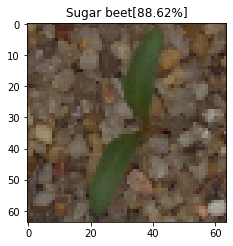

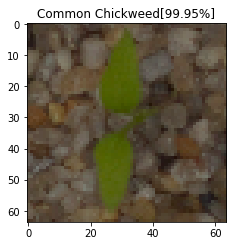

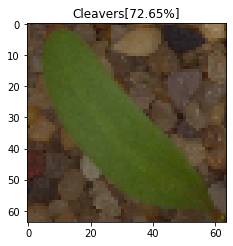

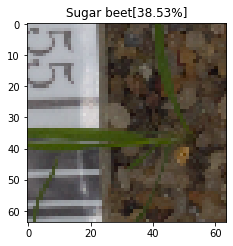

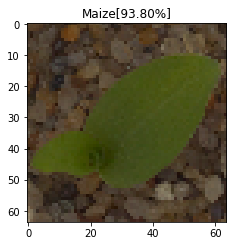

In [22]:
# Prediction
y_pred = classifier.predict(X_test)
y_pred_labels = np.argmax(y_pred,axis=1)

species_submissions = pd.DataFrame({'file':submission,'species':y_pred_labels})
species_submissions['species']=species_submissions['species'].apply(lambda pred:key_list[val_list.index(pred)])
species_submissions.to_csv('sample_submission.csv',index=False)

#Image Prediction
sample_labels = [2,3,33,36,39]
reference_sample_size=5
train_data_path='/content/drive/My Drive/Colab Notebooks/ImageClassificationData/train'
for row,label in zip(range(len(sample_labels)),sample_labels):
  plt.figure(figsize=(25,6*(row+1)))
  ax=plt.subplot(100*(row+1)+21)
  ax=plt.subplot(100*(row+1)+10*(reference_sample_size+1)+1)
  plt.title(species_submissions.iloc[label]['species']+'[%0.2f%%]' % (y_pred[label].max()*100))
  plt.imshow(img_to_array(tf.image.resize(X_test[label],[image_size[0],image_size[1]])))
plt.show()